# Analyzing Recidivism
### Arnav Sood (`arnav.sood@ubc.ca`)

```yaml

```

In [1]:
println("Executed $(read(`date`, String))")

Executed Wed Mar 13 17:28:07 PDT 2019



## Setup

First, let's load some useful packages

In [2]:
# using Pkg # uncomment these lines if you need to install packages
# pkg"add CSV DataFrames HTTP Plots StatsBase StatsPlots VegaLite CategoricalArrays GLM"
using CSV, DataFrames, HTTP, Plots, StatsBase, StatsPlots, VegaLite, CategoricalArrays, GLM
using Statistics, LinearAlgebra
gr(fmt = :png)

┌ Info: Precompiling VegaLite [112f6efa-9a02-5b7d-90c0-432ed331239a]
└ @ Base loading.jl:1186
┌ Warning: Module Colors with build ID 25582804838916 is missing from the cache.
│ This may mean Colors [5ae59095-9a9b-59fe-a467-6f913c188581] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:947
┌ Warning: Module Colors with build ID 25582804838916 is missing from the cache.
│ This may mean Colors [5ae59095-9a9b-59fe-a467-6f913c188581] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:947
┌ Warning: Module Colors with build ID 25582804838916 is missing from the cache.
│ This may mean Colors [5ae59095-9a9b-59fe-a467-6f913c188581] does not support precompilation but is imported by a module that does.
└ @ Base loading.jl:947
┌ Warning: Module Colors with build ID 25582804838916 is missing from the cache.
│ This may mean Colors [5ae59095-9a9b-59fe-a467-6f913c188581] does not support precompilation but is imported b

Plots.GRBackend()

And grab the data from the internet

In [3]:
url = "https://raw.githubusercontent.com/propublica/compas-analysis/master/compas-scores-two-years.csv"
raw = String(HTTP.get(url).body);
master = CSV.read(IOBuffer(raw));

As a sanity check, we can inspect the result

In [4]:
first(master, 6) # analogous to head(data)

,id,name,first,last,compas_screening_date,sex,dob,age,age_cat,race,juv_fel_count,decile_score,juv_misd_count,juv_other_count,priors_count,days_b_screening_arrest,c_jail_in,c_jail_out,c_case_number,c_offense_date,c_arrest_date,c_days_from_compas,c_charge_degree,c_charge_desc,is_recid,r_case_number,r_charge_degree,r_days_from_arrest,r_offense_date,r_charge_desc,r_jail_in,r_jail_out,violent_recid,is_violent_recid,vr_case_number,vr_charge_degree,vr_offense_date,vr_charge_desc,type_of_assessment,decile_score_1,score_text,screening_date,v_type_of_assessment,v_decile_score,v_score_text,v_screening_date,in_custody,out_custody,priors_count_1,start,end,event,two_year_recid
,Int64⍰,String⍰,String⍰,String⍰,Dates…⍰,String⍰,Dates…⍰,Int64⍰,String⍰,String⍰,Int64⍰,Int64⍰,Int64⍰,Int64⍰,Int64⍰,Int64⍰,String⍰,String⍰,String⍰,Dates…⍰,Dates…⍰,Int64⍰,String⍰,String⍰,Int64⍰,String⍰,String⍰,Int64⍰,Dates…⍰,String⍰,Dates…⍰,Dates…⍰,Missing,Int64⍰,String⍰,String⍰,Dates…⍰,String⍰,String⍰,Int64⍰,String⍰,Dates…⍰,String⍰,Int64⍰,String⍰,Dates…⍰,Dates…⍰,Dates…⍰,Int64⍰,Int64⍰,Int64⍰,Int64⍰,Int64⍰
1,1,miguel hernandez,miguel,hernandez,2013-08-14,Male,1947-04-18,69,Greater than 45,Other,0,1,0,0,0,-1,2013-08-13 06:03:42,2013-08-14 05:41:20,13011352CF10A,2013-08-13,missing,1,F,Aggravated Assault w/Firearm,0,missing,missing,missing,missing,missing,missing,missing,missing,0,missing,missing,missing,missing,Risk of Recidivism,1,Low,2013-08-14,Risk of Violence,1,Low,2013-08-14,2014-07-07,2014-07-14,0,0,327,0,0
2,3,kevon dixon,kevon,dixon,2013-01-27,Male,1982-01-22,34,25 - 45,African-American,0,3,0,0,0,-1,2013-01-26 03:45:27,2013-02-05 05:36:53,13001275CF10A,2013-01-26,missing,1,F,Felony Battery w/Prior Convict,1,13009779CF10A,(F3),missing,2013-07-05,Felony Battery (Dom Strang),missing,missing,missing,1,13009779CF10A,(F3),2013-07-05,Felony Battery (Dom Strang),Risk of Recidivism,3,Low,2013-01-27,Risk of Violence,1,Low,2013-01-27,2013-01-26,2013-02-05,0,9,159,1,1
3,4,ed philo,ed,philo,2013-04-14,Male,1991-05-14,24,Less than 25,African-American,0,4,0,1,4,-1,2013-04-13 04:58:34,2013-04-14 07:02:04,13005330CF10A,2013-04-13,missing,1,F,Possession of Cocaine,1,13011511MM10A,(M1),0,2013-06-16,Driving Under The Influence,2013-06-16,2013-06-16,missing,0,missing,missing,missing,missing,Risk of Recidivism,4,Low,2013-04-14,Risk of Violence,3,Low,2013-04-14,2013-06-16,2013-06-16,4,0,63,0,1
4,5,marcu brown,marcu,brown,2013-01-13,Male,1993-01-21,23,Less than 25,African-American,0,8,1,0,1,missing,missing,missing,13000570CF10A,2013-01-12,missing,1,F,Possession of Cannabis,0,missing,missing,missing,missing,missing,missing,missing,missing,0,missing,missing,missing,missing,Risk of Recidivism,8,High,2013-01-13,Risk of Violence,6,Medium,2013-01-13,missing,missing,1,0,1174,0,0
5,6,bouthy pierrelouis,bouthy,pierrelouis,2013-03-26,Male,1973-01-22,43,25 - 45,Other,0,1,0,0,2,missing,missing,missing,12014130CF10A,missing,2013-01-09,76,F,arrest case no charge,0,missing,missing,missing,missing,missing,missing,missing,missing,0,missing,missing,missing,missing,Risk of Recidivism,1,Low,2013-03-26,Risk of Violence,1,Low,2013-03-26,missing,missing,2,0,1102,0,0
6,7,marsha miles,marsha,miles,2013-11-30,Male,1971-08-22,44,25 - 45,Other,0,1,0,0,0,0,2013-11-30 04:50:18,2013-12-01 12:28:56,13022355MM10A,2013-11-30,missing,0,M,Battery,0,missing,missing,missing,missing,missing,missing,missing,missing,0,missing,missing,missing,missing,Risk of Recidivism,1,Low,2013-11-30,Risk of Violence,1,Low,2013-11-30,2013-11-30,2013-12-01,0,1,853,0,0


We can also look at the set of features we have

In [5]:
@show names(master);

names(master) = Symbol[:id, :name, :first, :last, :compas_screening_date, :sex, :dob, :age, :age_cat, :race, :juv_fel_count, :decile_score, :juv_misd_count, :juv_other_count, :priors_count, :days_b_screening_arrest, :c_jail_in, :c_jail_out, :c_case_number, :c_offense_date, :c_arrest_date, :c_days_from_compas, :c_charge_degree, :c_charge_desc, :is_recid, :r_case_number, :r_charge_degree, :r_days_from_arrest, :r_offense_date, :r_charge_desc, :r_jail_in, :r_jail_out, :violent_recid, :is_violent_recid, :vr_case_number, :vr_charge_degree, :vr_offense_date, :vr_charge_desc, :type_of_assessment, :decile_score_1, :score_text, :screening_date, :v_type_of_assessment, :v_decile_score, :v_score_text, :v_screening_date, :in_custody, :out_custody, :priors_count_1, :start, :end, :event, :two_year_recid]


The key one is `two_year_recid`, which we'll be trying to predict.

## Data Cleaning

First, we need to do some cleaning.

Let's create a `data` object, so that our transformations won't contaminate the master data source (this isn't too costly here.)

In [6]:
data = deepcopy(master);

Next, let's drop all rows that are missing values for some key features:

In [7]:
featureList = [:sex, :age, :age_cat, :race, :priors_count, :c_charge_degree,
                :decile_score, :score_text]; # list of features we require complete data for

dropmissing!(data, featureList; disallowmissing = true);
println("Dropped $(nrow(master) - nrow(data)) rows")

Dropped 0 rows


We can also look for subtler data errors

In [8]:
filter!(r -> ~ismissing(r.days_b_screening_arrest) && abs(r.days_b_screening_arrest) <= 30, data); # only include rows with less than a month between screening and arrest
println("Dropped $(nrow(master) - nrow(data)) rows")

Dropped 1042 rows


The justification here was that such a large gap between sentencing and arrest means that we don't have data on the correct offense.

## Exploratory Data Analysis (EDA)

At this stage, we can start to answer some basic questions.

While not strictly necessary for regression or visualization, this helps build an intuition for the dataset.

> What's the breakdown of recidivism by age and sex?

In [9]:
temp = by(data, [:age_cat, :sex], N = :two_year_recid => sum, p = :two_year_recid => mean, total = :two_year_recid => length)

,age_cat,sex,N,p,total
,String,String,Int64,Float64,Int64
1,Greater than 45,Male,355,0.337132,1053
2,25 - 45,Male,1380,0.485403,2843
3,Less than 25,Male,661,0.600363,1101
4,25 - 45,Female,261,0.37881,689
5,Greater than 45,Female,59,0.245833,240
6,Less than 25,Female,93,0.378049,246


> Can we get a visual snapshot of the data?

Glad you asked.

WARN column encoding should be discrete (ordinal / nominal / binned).
WARN column encoding should be discrete (ordinal / nominal / binned).


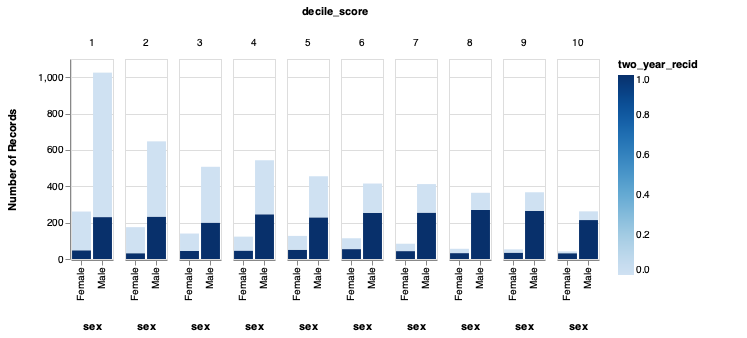

In [10]:
data |> @vlplot(:bar, x=:sex, column = :decile_score, color = :two_year_recid, y = "count()")

Here, the shaded area corresponds to recidivists, and the breakdown is by sex and decile.

> How well do recidivism scores correlate with actual recivisim?

One simple snapshot is:

In [11]:
cor(data[:decile_score], data[:two_year_recid])

0.36548710600251183

To be more precise

In [12]:
for subset in groupby(data, [:sex, :race])
      println("The correlation for $(levels(subset[:sex])) + $(levels(subset[:race])) is $(cor(subset[:decile_score], subset[:two_year_recid]))")
end

The correlation for ["Male"] + ["Other"] is 0.35137246743831974
The correlation for ["Male"] + ["African-American"] is 0.34082078132046023
The correlation for ["Male"] + ["Caucasian"] is 0.35236650261693725
The correlation for ["Female"] + ["Caucasian"] is 0.29756381726434983
The correlation for ["Male"] + ["Hispanic"] is 0.23780183725820161
The correlation for ["Female"] + ["African-American"] is 0.37361534399794005
The correlation for ["Female"] + ["Other"] is 0.35603611027826887
The correlation for ["Female"] + ["Hispanic"] is 0.22127323082243328
The correlation for ["Male"] + ["Asian"] is 0.6103035693851437
The correlation for ["Male"] + ["Native American"] is 0.5677749739576688
The correlation for ["Female"] + ["Native American"] is NaN
The correlation for ["Female"] + ["Asian"] is 1.0


This gives us a Cartesian grid for the utility of the decile score over race and sex.

We could visualize this data as such

In [13]:
# actual code goes here

Another way to answer this question is

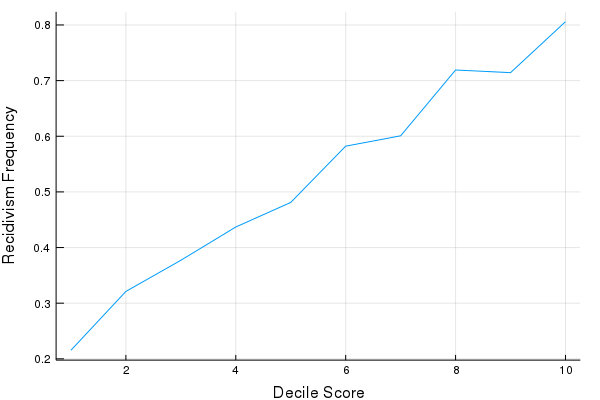

In [14]:
temp = by(filter(row -> row[:id] in data[:id], master),
      [:decile_score], p = :two_year_recid => mean);
sort!(temp, :decile_score);

plot(temp[:decile_score], temp[:p], legend = false, xlabel = "Decile Score", ylabel = "Recidivism Frequency")

So, recidivism risk is at least monotone in decile score, on aggregate.

> Can we add other features to the plot?

[some kind of pull-it-all-together, preferably interactive, visualization]

## Regression Problem

Let's say we wanted to write our model to predict the `two_year_recid` variable.

Since this is a binary feature, and we have labeled data, we are solving a supervised [classification problem](https://en.wikipedia.org/wiki/Statistical_classification).

### Coding Categorical Variables

The first challenge is to turn our string variables into a more machine-readable form, which might e.g. have ordering.

The solution is to create categorical variables.

In [26]:
data[:age_cat] = categorical(data[:age_cat]; ordered = true);
levels!(data[:age_cat], ["Less than 25", "25 - 45", "Greater than 45"]); # orders the new variable

To see the difference

In [27]:
@show typeof(master[:age_cat][1]); # old
@show typeof(data[:age_cat][1]); # new

typeof((master[:age_cat])[1]) = String
typeof((data[:age_cat])[1]) = CategoricalString{UInt32}


Now, for example, we can write logic like

In [28]:
@show data[:age_cat][2]
@show data[:age_cat][50]
@show data[:age_cat][2] < data[:age_cat][50];

(data[:age_cat])[2] = "25 - 45"
(data[:age_cat])[50] = "Greater than 45"
(data[:age_cat])[2] < (data[:age_cat])[50] = true


Let's do the rest of the transformations

In [30]:
data[:sex] = categorical(data[:sex]);

data[:race] = categorical(data[:race]);

data[:c_charge_degree] = categorical(data[:c_charge_degree]; ordered = true);
levels!(data[:c_charge_degree], ["M", "F"]); # (M)isdemeanor < (F)elony

data[:score_text] = categorical(data[:score_text]; ordered = true);
levels!(data[:score_text], ["Low", "Medium", "High"]);

This makes it easier to run regression models that are mixed on categorical and continuous data.

### Linear Case

A benchmark model for many applications is a generalized linear model.

Since our response variable is binary, we might consider a simple [probit regression](https://en.wikipedia.org/wiki/Probit_model).

Let's set up a training set

In [31]:
function StatsBase.sample(df::AbstractDataFrame, n::Integer=1; replace::Bool=true, ordered::Bool=false) # see https://github.com/JuliaData/DataFrames.jl/pull/997/files
    df[sample(1:size(df, 1), n, replace=replace, ordered=ordered), :]
end

training = sample(data, 3000);

And fit a model to that training set

In [32]:
linearModel = glm(@formula(two_year_recid ~ race + sex + age_cat + decile_score), training, Binomial(), ProbitLink())

StatsModels.DataFrameRegressionModel{GeneralizedLinearModel{GlmResp{Array{Float64,1},Binomial{Float64},ProbitLink},DensePredChol{Float64,Cholesky{Float64,Array{Float64,2}}}},Array{Float64,2}}

Formula: two_year_recid ~ 1 + race + sex + age_cat + decile_score

Coefficients:
                            Estimate  Std.Error   z value Pr(>|z|)
(Intercept)                -0.838522   0.093793  -8.94013   <1e-18
race: Asian                -0.844527   0.481168  -1.75516   0.0792
race: Caucasian           -0.0278503  0.0544175 -0.511789   0.6088
race: Hispanic            -0.0605392  0.0902475 -0.670813   0.5023
race: Native American       0.311491   0.552944  0.563332   0.5732
race: Other               -0.0521651   0.111599 -0.467433   0.6402
sex: Male                   0.231555  0.0618771   3.74218   0.0002
age_cat: 25 - 45          -0.0629997  0.0607964  -1.03624   0.3001
age_cat: Greater than 45   -0.231235  0.0788349  -2.93315   0.0034
decile_score                0.147721 0.00949672    15.55

We can interpret the magnitudes and signs of the coefficients for each class.

For example, decile score is positively associated with recidivism within two years, whereas being older than 45 is negatively correlated.

We can judge the performance of this model on the whole data.

In [33]:
predictions = predict(linearModel, data);
map!(x -> x >= 0.5 ? 1 : 0, predictions, predictions);
println("The model agreed with the outcome in $(count(iszero, predictions - data[:two_year_recid])) cases out of $(nrow(data))")

The model agreed with the outcome in 4107 cases out of 6172


This isn't bad, for a simple linear model we cooked up on a small set of features.

Let's try to do better. For example, what if we add some interaction terms?

Specifically, let's try to capture two stylized facts from the ProPublica analysis:

1. The decile scores have different accuracies by sex.

2. Being young and male is a greater predictor of criminality than being old and male.

In [34]:
revisedModel = glm(@formula(two_year_recid ~ race + sex + age_cat + decile_score + sex&age_cat + sex&decile_score), training, Binomial(), ProbitLink())

StatsModels.DataFrameRegressionModel{GeneralizedLinearModel{GlmResp{Array{Float64,1},Binomial{Float64},ProbitLink},DensePredChol{Float64,Cholesky{Float64,Array{Float64,2}}}},Array{Float64,2}}

Formula: two_year_recid ~ 1 + race + sex + age_cat + decile_score + sex & age_cat + sex & decile_score

Coefficients:
                                         Estimate Std.Error   z value Pr(>|z|)
(Intercept)                             -0.978505  0.177847  -5.50194    <1e-7
race: Asian                             -0.848532  0.482574  -1.75835   0.0787
race: Caucasian                         -0.026909 0.0545106 -0.493648   0.6216
race: Hispanic                         -0.0635201 0.0902839  -0.70356   0.4817
race: Native American                    0.237305  0.564576  0.420324   0.6742
race: Other                            -0.0531958  0.111624 -0.476563   0.6337
sex: Male                                0.401503  0.192557   2.08512   0.0371
age_cat: 25 - 45                        0.0513584  0.1414

As we can see, whereas `sex: Male` is a huge boost to the likelihood of recidivism, being `sex: Male & age_cat: Greater than 45` has an almost equally negative effect.

We can see how this model stacks up

In [36]:
predictions = predict(revisedModel, data);
map!(x -> x >= 0.5 ? 1 : 0, predictions, predictions);
println("The model agreed with the outcome in $(count(iszero, predictions - data[:two_year_recid])) cases out of $(nrow(data))")

The model agreed with the outcome in 4114 cases out of 6172


So, about the same as the original model.

### Accuracy Analysis

One of the key criticisms of the ProPublica analysis is that the error of the model was nonuniform; that is, it systematically penalized some demographics and benefitted others.

Let's investigate that for our model.

### Neural Networks

One of the advantages of the function representations known as [Artificial Neural Networks](https://en.wikipedia.org/wiki/Artificial_neural_network) is that they can represent any bounded, continuous function.

However, this [result](https://en.wikipedia.org/wiki/Universal_approximation_theorem) is also a drawback, as it means that without strict discipline, it's very easy for our nets to go astray.

Let's try adapting one for this purpose.